In [1]:
# importing libraries
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

# load dataset from SHRS_smallDS.xlsx
data = pd.read_excel('SHRS_smallDS.xlsx',index_col=False)

# clean dataset
missing_values = data.isnull().sum()
df_dropped = data.dropna()
data['Survival months'] = data['Survival months'].replace('Unknown', 0).astype(int)

# filter the dataset
def Survival(row):
    if (row['Survival months'] >= 60) and (row['Vital status recode (study cutoff used)'] == 'Alive'):
        return 1
    elif (row['Survival months'] < 60) and (row['SEER cause-specific death classification'] == 'Dead (attributable to this cancer dx)'):
        return 0
    else:
        data.drop(index=row.name, inplace=True)

data['Survived'] = data.apply(Survival, axis=1)

In [2]:
import re

# get the first two interger from a string
def get_first_two_ints(s):
    numbers = re.findall(r'\d+', s)
    return [int(num) for num in numbers[:2]]

# convert to numerical form
data['Age'] = None
data['Income'] = None
data['Tumor Size'] = None
data['Grade Recode'] = None

GR = {'Unknown': 0,'Undifferentiated; anaplastic; Grade IV': 4, 'Poorly differentiated; Grade III': 3, 'Moderately differentiated; Grade II': 2, 'Well differentiated; Grade I': 1}

for index, row in data.iterrows():
    data.at[index, 'Age'] = data.at[index, 'Age recode with <1 year olds'][:2]
    data.at[index, 'Income'] = get_first_two_ints(data.at[index, 'Median household income inflation adj to 2021'])[0]
    if data.at[index, 'CS Tumor Size/Ext Eval (2004-2015)'] == 'Blank(s)':
        data.at[index, 'Tumor Size'] = 0
    else:
        data.at[index, 'Tumor Size'] = data.at[index, 'CS Tumor Size/Ext Eval (2004-2015)']
    data.at[index, 'Grade Recode'] = GR[data.at[index, 'Grade Recode (thru 2017)']]
    
data['Survived'] = data['Survived'].astype(int)
data['Age'] = data['Age'].astype(int)
data['Income'] = data['Income'].astype(int)
data['Tumor Size'] = data['Tumor Size'].astype(int)
data['Grade Recode'] = data['Grade Recode'].astype(int)
data[:5]

,Site recode ICD-O-3/WHO 2008,Behavior code ICD-O-3,Primary Site,Histologic Type ICD-O-3,Grade Recode (thru 2017),Marital status at diagnosis,Median household income inflation adj to 2021,Regional nodes examined (1988+),Regional nodes positive (1988+),SEER cause-specific death classification,...,Age recode with <1 year olds,"Race recode (White, Black, Other)",Sex,Year of diagnosis,CS Tumor Size/Ext Eval (2004-2015),Survived,Age,Income,Tumor Size,Grade Recode
1,Rectum,Malignant,209,8140,Well differentiated; Grade I,Single (never married),"$75,000+",10,0,Dead (attributable to this cancer dx),...,65-69 years,White,Male,2000,Blank(s),0,65,75,0,1
2,Rectosigmoid Junction,Malignant,199,8140,Moderately differentiated; Grade II,Single (never married),"$75,000+",8,1,Alive or dead of other cause,...,35-39 years,White,Female,2008,3,1,35,75,3,2
3,Ascending Colon,Malignant,182,8140,Moderately differentiated; Grade II,Widowed,"$75,000+",14,1,Dead (attributable to this cancer dx),...,60-64 years,Black,Male,1995,Blank(s),0,60,75,0,2
4,Lung and Bronchus,Malignant,343,8012,Well differentiated; Grade I,Married (including common law),"$75,000+",1,1,Dead (attributable to this cancer dx),...,35-39 years,White,Female,1992,Blank(s),0,35,75,0,1
5,Breast,Malignant,506,8520,Moderately differentiated; Grade II,Divorced,"$75,000+",0,98,Dead (attributable to this cancer dx),...,75-79 years,White,Female,2003,Blank(s),0,75,75,0,2


In [3]:
# make a new data frame and store the useful attributes
final_data = data[['Site recode ICD-O-3/WHO 2008','Race recode (White, Black, Other)',
           'Sex',
           'Histologic Type ICD-O-3',
           'Regional nodes examined (1988+)',
           'Regional nodes positive (1988+)',
           'Primary Site',
           'Marital status at diagnosis',
           'Survived',
           'Age',
           'Income',
           'Tumor Size',
           'Grade Recode']]
final_data[:5]

,Site recode ICD-O-3/WHO 2008,"Race recode (White, Black, Other)",Sex,Histologic Type ICD-O-3,Regional nodes examined (1988+),Regional nodes positive (1988+),Primary Site,Marital status at diagnosis,Survived,Age,Income,Tumor Size,Grade Recode
1,Rectum,White,Male,8140,10,0,209,Single (never married),0,65,75,0,1
2,Rectosigmoid Junction,White,Female,8140,8,1,199,Single (never married),1,35,75,3,2
3,Ascending Colon,Black,Male,8140,14,1,182,Widowed,0,60,75,0,2
4,Lung and Bronchus,White,Female,8012,1,1,343,Married (including common law),0,35,75,0,1
5,Breast,White,Female,8520,0,98,506,Divorced,0,75,75,0,2


In [4]:
# Initialize a dictionary to store the mappings
category_mappings = {}

# Manually encode each categorical column to numerical values
for column in final_data.select_dtypes(include=['object']):
    # Create a mapping for the current column
    categories = final_data[column].unique()
    mapping = {category: index for index, category in enumerate(categories)}
    category_mappings[column] = mapping

    # Replace the categorical values with numerical values
    final_data[column] = final_data[column].replace(mapping)

print("\nCategory Mappings:")
for column, mapping in category_mappings.items():
    print(f"{column}: {mapping}")


Category Mappings:
Site recode ICD-O-3/WHO 2008: {'Rectum': 0, 'Rectosigmoid Junction': 1, 'Ascending Colon': 2, 'Lung and Bronchus': 3, 'Breast': 4, 'Cecum': 5, 'Corpus Uteri': 6, 'Esophagus': 7, 'Sigmoid Colon': 8, 'Gallbladder': 9, 'Stomach': 10, 'Liver': 11, 'Hepatic Flexure': 12, 'Prostate': 13, 'Cervix Uteri': 14, 'Appendix': 15, 'Splenic Flexure': 16, 'Descending Colon': 17, 'Transverse Colon': 18, 'Large Intestine, NOS': 19}
Race recode (White, Black, Other): {'White': 0, 'Black': 1, 'Other (American Indian/AK Native, Asian/Pacific Islander)': 2}
Sex: {'Male': 0, 'Female': 1}
Marital status at diagnosis: {'Single (never married)': 0, 'Widowed': 1, 'Married (including common law)': 2, 'Divorced': 3, 'Separated': 4}


/var/folders/dy/zjlt7bwn2kvbpxc2h2qggh180000gn/T/ipykernel_29145/4242923179.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_data[column] = final_data[column].replace(mapping)


In [5]:
final_data.shape

(14641, 13)

In [6]:
final_data[:5]

,Site recode ICD-O-3/WHO 2008,"Race recode (White, Black, Other)",Sex,Histologic Type ICD-O-3,Regional nodes examined (1988+),Regional nodes positive (1988+),Primary Site,Marital status at diagnosis,Survived,Age,Income,Tumor Size,Grade Recode
1,0,0,0,8140,10,0,209,0,0,65,75,0,1
2,1,0,1,8140,8,1,199,0,1,35,75,3,2
3,2,1,0,8140,14,1,182,1,0,60,75,0,2
4,3,0,1,8012,1,1,343,2,0,35,75,0,1
5,4,0,1,8520,0,98,506,3,0,75,75,0,2


# Cancer Types and Stages

In [7]:
# Select the cancer type: 'Rectum': 0, 'Rectosigmoid Junction': 1, 'Ascending Colon': 2, 'Lung and Bronchus': 3, 'Breast': 4, 'Cecum': 5, 'Corpus Uteri': 6, 'Esophagus': 7, 'Sigmoid Colon': 8, 'Gallbladder': 9, 'Stomach': 10, 'Liver': 11, 'Hepatic Flexure': 12, 'Prostate': 13, 'Cervix Uteri': 14, 'Appendix': 15, 'Splenic Flexure': 16, 'Descending Colon': 17, 'Transverse Colon': 18, 'Large Intestine, NOS': 19
cancer_type = 4
# Select the stage,1 for Grade I, 2 for Grade II...0 for Unknown
stage = 4

In [8]:
cancer_type_df = final_data[final_data['Site recode ICD-O-3/WHO 2008'] == cancer_type]
cancer_type_df.head()

,Site recode ICD-O-3/WHO 2008,"Race recode (White, Black, Other)",Sex,Histologic Type ICD-O-3,Regional nodes examined (1988+),Regional nodes positive (1988+),Primary Site,Marital status at diagnosis,Survived,Age,Income,Tumor Size,Grade Recode
5,4,0,1,8520,0,98,506,3,0,75,75,0,2
6,4,0,1,8520,20,0,504,0,0,35,75,0,0
7,4,0,1,8500,0,98,504,2,0,55,75,0,3
18,4,0,1,8500,15,12,509,0,0,55,75,0,0
20,4,0,1,8513,7,0,504,2,1,40,75,0,3


In [9]:
cancer_type_df.shape

(3242, 13)

In [10]:
cancer_type_stage_df = cancer_type_df[cancer_type_df['Grade Recode'] == stage]
print(cancer_type_stage_df.shape)
print(cancer_type_stage_df.head())

(69, 13)
      Site recode ICD-O-3/WHO 2008  Race recode (White, Black, Other)  Sex  \
122                              4                                  0    1   
386                              4                                  1    1   
425                              4                                  1    1   
1811                             4                                  0    1   
1933                             4                                  1    1   

      Histologic Type ICD-O-3  Regional nodes examined (1988+)  \
122                      8500                               13   
386                      8500                                9   
425                      8500                                8   
1811                     8501                               22   
1933                     8500                               20   

      Regional nodes positive (1988+)  Primary Site  \
122                                10           504   
386            

In [11]:
from sklearn.model_selection import train_test_split
from fairlearn.reductions import ExponentiatedGradient, EqualizedOdds
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

from aif360.sklearn.inprocessing import ExponentiatedGradientReduction

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# separate array into input and output components
X = cancer_type_stage_df.drop(['Survived', 'Site recode ICD-O-3/WHO 2008', 'Grade Recode'], axis=1)
y = cancer_type_stage_df['Survived']

(X_train, X_test,
 y_train, y_test) = train_test_split(X, y, train_size=0.8, random_state=42)

In [12]:
prot_attr_cols = [colname for colname in X_train 
                  if "Sex" in colname or "Marital status at diagnosis" in colname 
                  or "Race recode (White, Black, Other)" in colname or "Income" in colname]
prot_attr_cols

['Race recode (White, Black, Other)',
 'Sex',
 'Marital status at diagnosis',
 'Income']

# 1. Logestic Regression

In [24]:
from sklearn.linear_model import LogisticRegression
lr_estimator = LogisticRegression(solver='liblinear')
lr_exp_grad_red = ExponentiatedGradientReduction(prot_attr=prot_attr_cols, 
                                              estimator=lr_estimator, 
                                              constraints="EqualizedOdds",
                                              drop_prot_attr=False)
lr_exp_grad_red.fit(X_train, y_train)
lr_egr_acc = lr_exp_grad_red.score(X_test, y_test)
print(lr_egr_acc)

0.8571428571428571


In [18]:
# Without fairness
lr = LogisticRegression(solver='liblinear')
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
lr_acc = accuracy_score(y_test, y_pred)
lr_acc

0.7142857142857143

## 1.1 SHAP For Logestic Regression

In [15]:
# import shap and data visualization tool
import shap
import matplotlib.pyplot as plt

# load JS visualization code to notebook
shap.initjs()

lr_explainer = shap.Explainer(lr_exp_grad_red.predict, X_train)

# Calculate SHAP values for the subset
lr_shap_values = lr_explainer(X_test)

Mitigated Variable Importance Plot - Global Interpretation


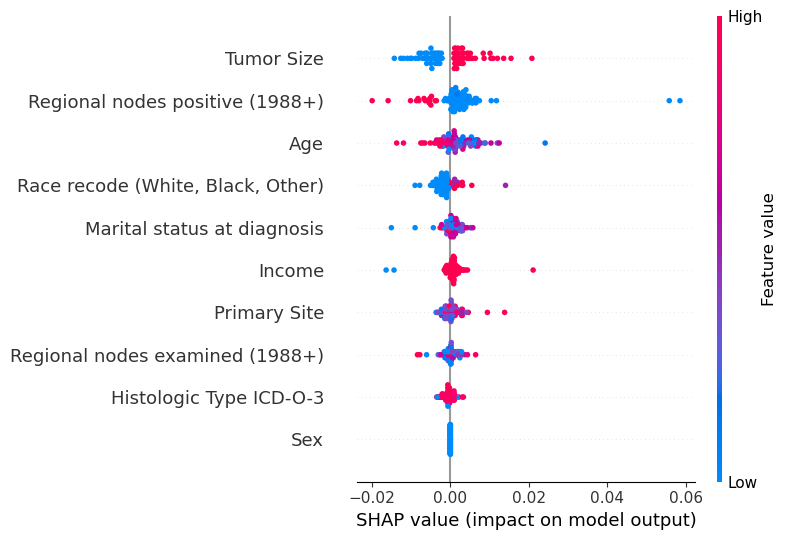

In [16]:
print("Mitigated Variable Importance Plot - Global Interpretation")
figure = plt.figure()
shap.summary_plot(lr_shap_values, X_test)

In [17]:
# Create the explainer for unmitigated model
lr_unmitigated_explainer = shap.Explainer(lr.predict, X_train)
lr_unmitigated_shap_values = lr_unmitigated_explainer(X_test)

Unmitigated Variable Importance Plot - Global Interpretation


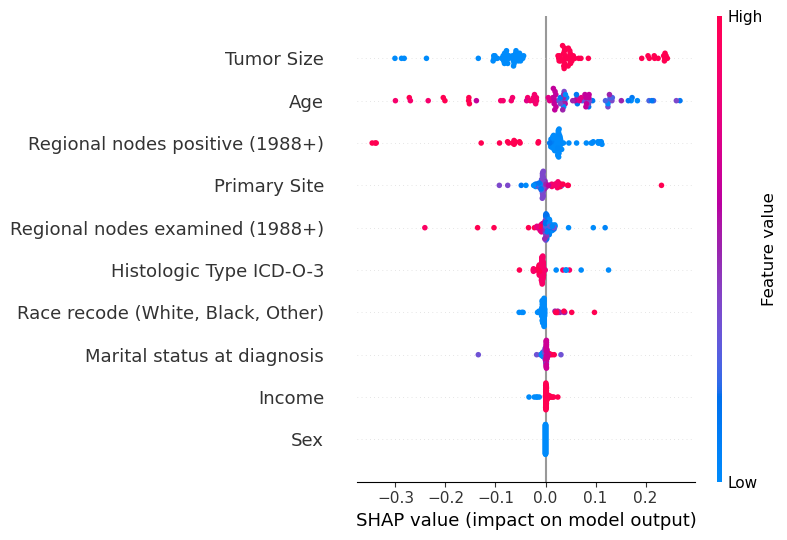

In [18]:
print("Unmitigated Variable Importance Plot - Global Interpretation")
figure = plt.figure()
shap.summary_plot(lr_unmitigated_shap_values, X_test)

## 1.2 LIME For Logestic Regression

In [19]:
# import the LimeTabularExplainer module
import lime
import lime.lime_tabular
import numpy as np


# get the feature names
feature_names = list(X_test.columns)

# Fit the Explainer on the training data set using the LimeTabularExplainer
lr_explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_test),
                                 feature_names=X_test.columns,
                                 class_names = ['Dead', 'Alive'], 
                                 mode = 'classification')

In [20]:
# predict_fn_rf = lambda x: rf.predict_proba(x).astype(float)
i = np.random.randint(len(X_test))
print(y_test.iloc[i])
lr_exp = lr_explainer.explain_instance(X_test.iloc[i], lr_exp_grad_red.predict_proba)
lr_exp.show_in_notebook(show_all=False)

1


X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names


In [21]:
lr_exp = lr_explainer.explain_instance(X_test.iloc[i], lr.predict_proba)
lr_exp.show_in_notebook(show_all=False)

X does not have valid feature names, but LogisticRegression was fitted with feature names


# 2. Decision Tree

In [69]:
from sklearn.tree import DecisionTreeClassifier
dt_estimator = DecisionTreeClassifier()
dt_exp_grad_red = ExponentiatedGradientReduction(prot_attr=prot_attr_cols, 
                                              estimator=dt_estimator, 
                                              constraints="EqualizedOdds",
                                              drop_prot_attr=False)
dt_exp_grad_red.fit(X_train, y_train)
dt_egr_acc = dt_exp_grad_red.score(X_test, y_test)
print(dt_egr_acc)

0.9411764705882353


In [70]:
# Without fairness
dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)
y_pred = dt.predict(X_test)
dt_acc = accuracy_score(y_test, y_pred)
dt_acc

0.9117647058823529

## 2.1 SHAP For Decision Tree

In [24]:
# import shap and data visualization tool
import shap
import matplotlib.pyplot as plt

# load JS visualization code to notebook
shap.initjs()

# Create the explainer using the subset
dt_explainer = shap.Explainer(dt_exp_grad_red.predict, X_train)

# Calculate SHAP values for the subset
dt_shap_values = dt_explainer(X_test)

Mitigated Variable Importance Plot - Global Interpretation


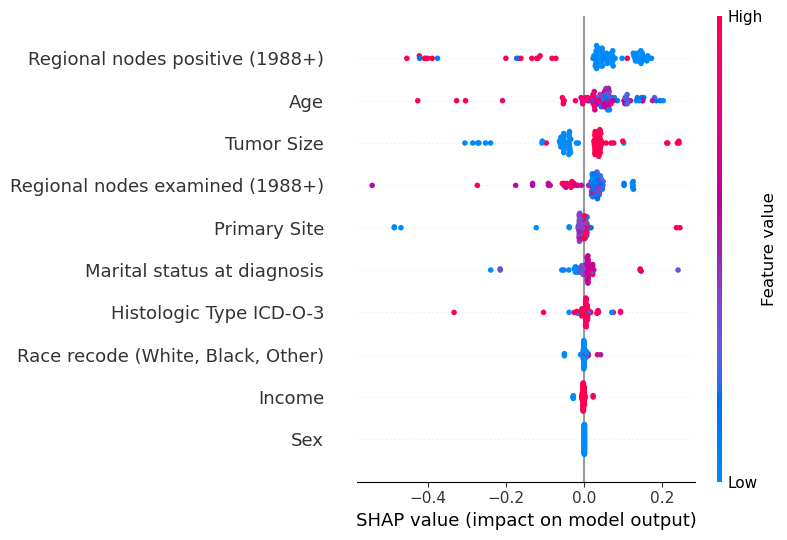

In [25]:
print("Mitigated Variable Importance Plot - Global Interpretation")
figure = plt.figure()
shap.summary_plot(dt_shap_values, X_test)

Unmitigated Variable Importance Plot - Global Interpretation


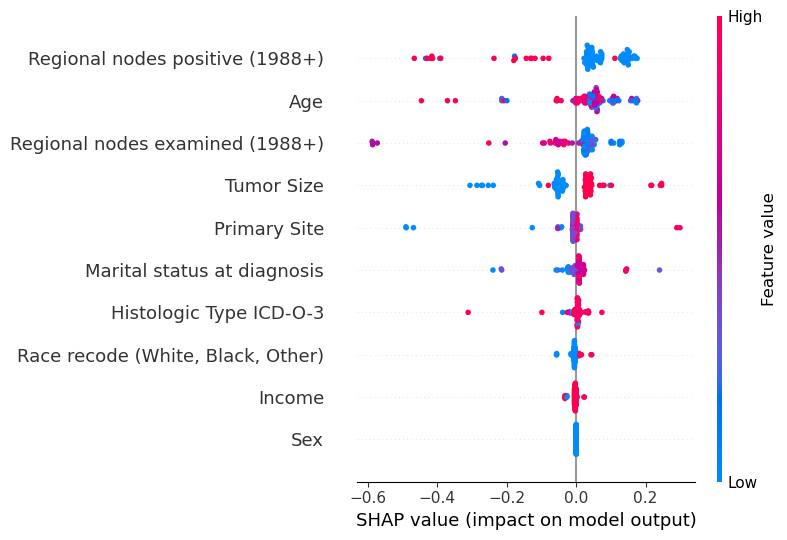

In [26]:
# Create the explainer
dt_unmitigated_explainer = shap.Explainer(dt.predict, X_train)
dt_unmitigated_shap_values = dt_unmitigated_explainer(X_test)
print("Unmitigated Variable Importance Plot - Global Interpretation")
figure = plt.figure()
shap.summary_plot(dt_unmitigated_shap_values, X_test)

## 2.2 LIME For Decision Tree

In [27]:
# import the LimeTabularExplainer module
import lime
import lime.lime_tabular
import numpy as np


# get the feature names
feature_names = list(X_test.columns)

# Fit the Explainer on the training data set using the LimeTabularExplainer
dt_explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_test),
                                 feature_names=X_test.columns,
                                 class_names = ['Dead', 'Alive'], 
                                 mode = 'classification')

In [28]:
# predict_fn_rf = lambda x: rf.predict_proba(x).astype(float)
i = np.random.randint(len(X_test))
print(y_test.iloc[i])
dt_exp = dt_explainer.explain_instance(X_test.iloc[i], dt_exp_grad_red.predict_proba)
dt_exp.show_in_notebook(show_all=False)

1


X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names


In [29]:
dt_exp = dt_explainer.explain_instance(X_test.iloc[i], dt.predict_proba)
dt_exp.show_in_notebook(show_all=False)

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names


# 3. Naive Bayes

In [30]:
from sklearn.naive_bayes import GaussianNB

nb_estimator = GaussianNB()
nb_exp_grad_red = ExponentiatedGradientReduction(prot_attr=prot_attr_cols, 
                                              estimator=nb_estimator, 
                                              constraints="EqualizedOdds",
                                              drop_prot_attr=False)
nb_exp_grad_red.fit(X_train, y_train)
nb_egr_acc = nb_exp_grad_red.score(X_test, y_test)
print(nb_egr_acc)

0.6292134831460674


In [31]:
# Without fairness
nb = GaussianNB()
nb.fit(X_train, y_train)
y_pred = nb.predict(X_test)
nb_acc = accuracy_score(y_test, y_pred)
nb_acc

0.8314606741573034

## 3.1 SHAP For Naive Bayes

In [32]:
# import shap and data visualization tool
import shap
import matplotlib.pyplot as plt

# load JS visualization code to notebook
shap.initjs()

# Create the explainer using the subset
nb_explainer = shap.Explainer(nb_exp_grad_red.predict, X_train)

# Calculate SHAP values for the subset
nb_shap_values = nb_explainer(X_test)

Mitigated Variable Importance Plot - Global Interpretation


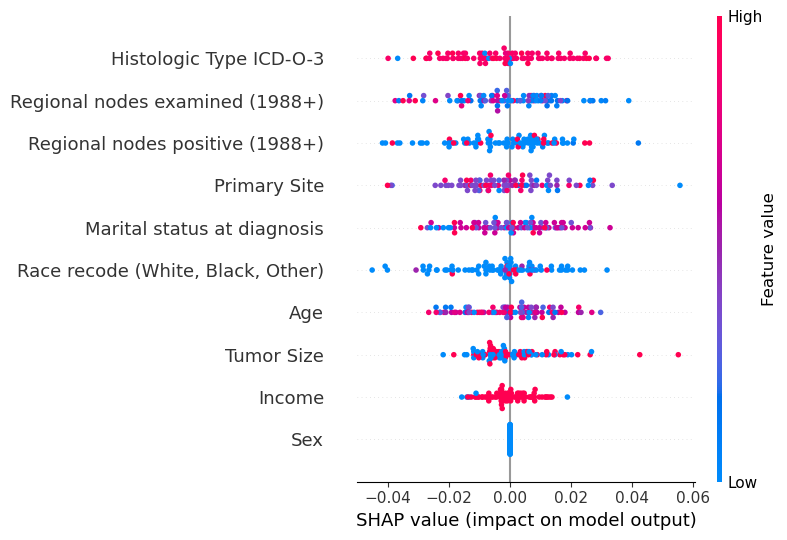

In [33]:
print("Mitigated Variable Importance Plot - Global Interpretation")
figure = plt.figure()
shap.summary_plot(nb_shap_values, X_test)

In [34]:
# Create the explainer for unmitigated model
nb_unimitigated_explainer = shap.Explainer(nb.predict, X_train)

# Calculate SHAP values for the subset
nb_unimitigated_shap_values = nb_unimitigated_explainer(X_test)

Unmitigated Variable Importance Plot - Global Interpretation


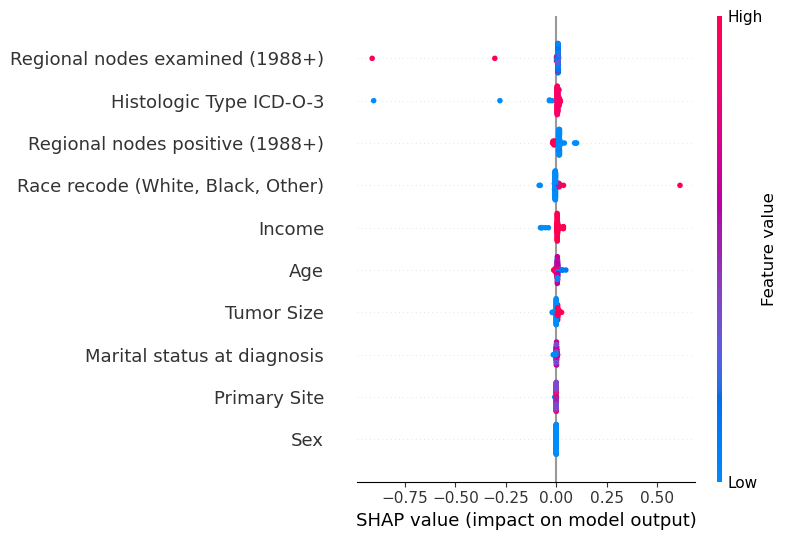

In [35]:
print("Unmitigated Variable Importance Plot - Global Interpretation")
figure = plt.figure()
shap.summary_plot(nb_unimitigated_shap_values, X_test)

## 3.2 LIME For Naive Bayes

In [36]:
# import the LimeTabularExplainer module
import lime
import lime.lime_tabular
import numpy as np


# get the feature names
feature_names = list(X_test.columns)

# Fit the Explainer on the training data set using the LimeTabularExplainer
nb_explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_test),
                                 feature_names=X_test.columns,
                                 class_names = ['Dead', 'Alive'], 
                                 mode = 'classification')

In [37]:
i = np.random.randint(len(X_test))
print(y_test.iloc[i])
nb_exp = nb_explainer.explain_instance(X_test.iloc[i], nb_exp_grad_red.predict_proba)
nb_exp.show_in_notebook(show_all=False)

1


X does not have valid feature names, but GaussianNB was fitted with feature names
X does not have valid feature names, but GaussianNB was fitted with feature names
X does not have valid feature names, but GaussianNB was fitted with feature names
X does not have valid feature names, but GaussianNB was fitted with feature names
X does not have valid feature names, but GaussianNB was fitted with feature names
X does not have valid feature names, but GaussianNB was fitted with feature names
X does not have valid feature names, but GaussianNB was fitted with feature names


In [38]:
nb_exp = nb_explainer.explain_instance(X_test.iloc[i], nb.predict_proba)
nb_exp.show_in_notebook(show_all=False)

X does not have valid feature names, but GaussianNB was fitted with feature names


# 4. AdaBoost

In [71]:
from sklearn.ensemble import AdaBoostClassifier

ada_estimator = AdaBoostClassifier()
ada_exp_grad_red = ExponentiatedGradientReduction(prot_attr=prot_attr_cols, 
                                              estimator=ada_estimator, 
                                              constraints="EqualizedOdds",
                                              drop_prot_attr=False)
ada_exp_grad_red.fit(X_train, y_train)
ada_egr_acc = ada_exp_grad_red.score(X_test, y_test)
print(ada_egr_acc)

0.8529411764705882


In [72]:
# Without fairness
ada = AdaBoostClassifier()
ada.fit(X_train, y_train)
y_pred = ada.predict(X_test)
ada_acc = accuracy_score(y_test, y_pred)
ada_acc

0.8529411764705882

## 4.1 SHAP For AdaBoost

In [41]:
# import shap and data visualization tool
import shap
import matplotlib.pyplot as plt

# load JS visualization code to notebook
shap.initjs()

# Create the explainer using the subset
ada_explainer = shap.Explainer(ada_exp_grad_red.predict, X_train)

# Calculate SHAP values for the subset
ada_shap_values = ada_explainer(X_test)

ExactExplainer explainer: 90it [01:20,  1.02s/it]                               


Mitigated Variable Importance Plot - Global Interpretation


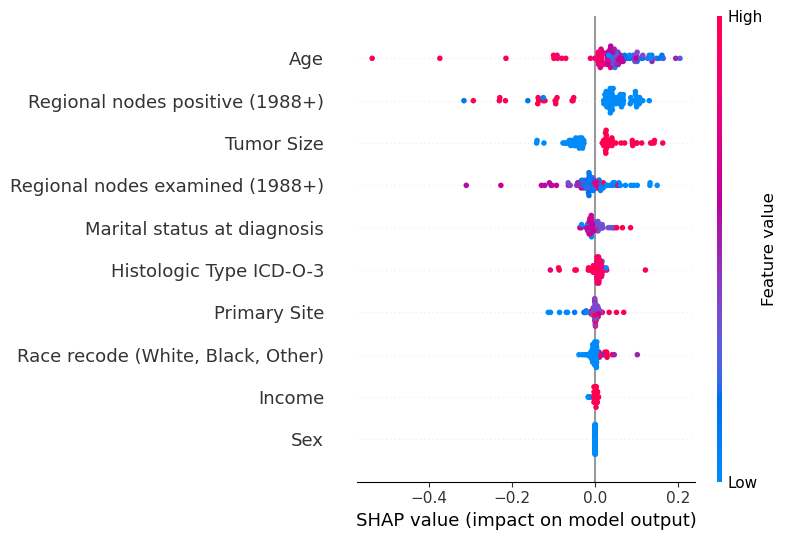

In [42]:
print("Mitigated Variable Importance Plot - Global Interpretation")
figure = plt.figure()
shap.summary_plot(ada_shap_values, X_test)

In [43]:
# Create the explainer for unmitigated model
ada_unmitigated_explainer = shap.Explainer(ada.predict, X_train)

# Calculate SHAP values for the subset
ada_unmitigated_shap_values = ada_unmitigated_explainer(X_test)

Unmitigated Variable Importance Plot - Global Interpretation


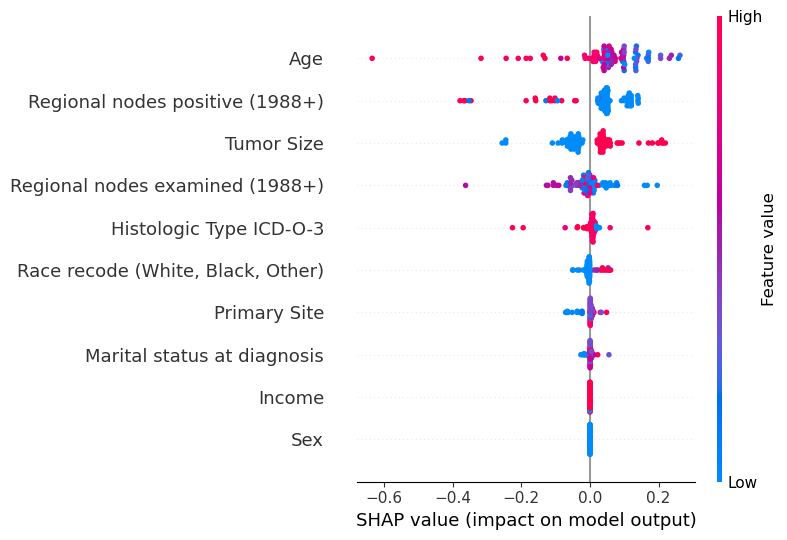

In [44]:
print("Unmitigated Variable Importance Plot - Global Interpretation")
figure = plt.figure()
shap.summary_plot(ada_unmitigated_shap_values, X_test)

## 4.2 LIME For AdaBoost

In [45]:
# import the LimeTabularExplainer module
import lime
import lime.lime_tabular
import numpy as np


# get the feature names
feature_names = list(X_test.columns)

# Fit the Explainer on the training data set using the LimeTabularExplainer
ada_explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_test),
                                 feature_names=X_test.columns,
                                 class_names = ['Dead', 'Alive'], 
                                 mode = 'classification')

In [46]:
i = np.random.randint(len(X_test))
print(y_test.iloc[i])
ada_exp = ada_explainer.explain_instance(X_test.iloc[i], ada_exp_grad_red.predict_proba)
ada_exp.show_in_notebook(show_all=False)

1


X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
X does not

In [47]:
ada_exp = ada_explainer.explain_instance(X_test.iloc[i], ada.predict_proba)
ada_exp.show_in_notebook(show_all=False)

X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


# 5. XGBoost

In [67]:
from xgboost import XGBClassifier

xgb_estimator = XGBClassifier()
xgb_exp_grad_red = ExponentiatedGradientReduction(prot_attr=prot_attr_cols, 
                                              estimator=xgb_estimator, 
                                              constraints="EqualizedOdds",
                                              drop_prot_attr=False)
xgb_exp_grad_red.fit(X_train, y_train)
xgb_egr_acc = xgb_exp_grad_red.score(X_test, y_test)
print(xgb_egr_acc)

0.9411764705882353


In [68]:
# Without fairness
xgb = XGBClassifier()
xgb.fit(X_train, y_train)
y_pred = xgb.predict(X_test)
xgb_acc = accuracy_score(y_test, y_pred)
xgb_acc

0.9117647058823529

## 5.1 SHAP For XGBoost

In [50]:
# import shap and data visualization tool
import shap
import matplotlib.pyplot as plt

# load JS visualization code to notebook
shap.initjs()

# Create the explainer using the subset
xgb_explainer = shap.Explainer(xgb_exp_grad_red.predict, X_train)

# Calculate SHAP values for the subset
xgb_shap_values = xgb_explainer(X_test)

ExactExplainer explainer: 90it [00:19,  2.25it/s]                               


Mitigated Variable Importance Plot - Global Interpretation


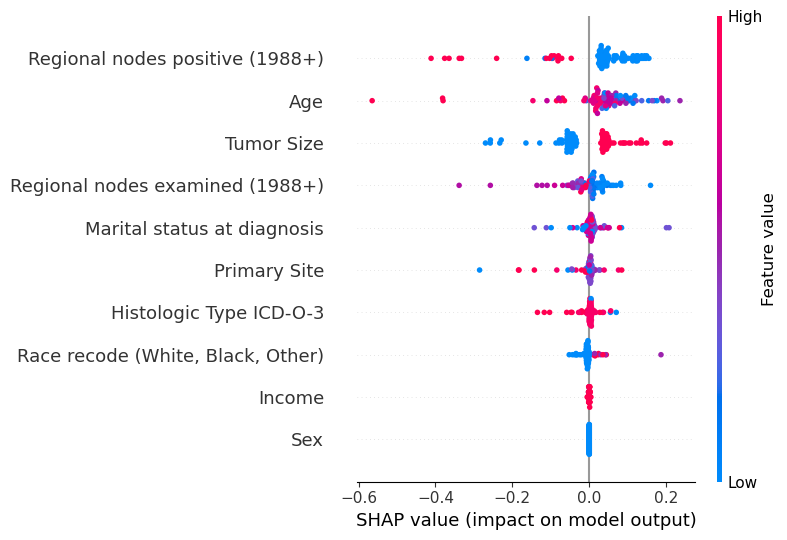

In [51]:
print("Mitigated Variable Importance Plot - Global Interpretation")
figure = plt.figure()
shap.summary_plot(xgb_shap_values, X_test)

In [52]:
# Create the explainer for unmitigated model
xgb_unmitigated_explainer = shap.Explainer(xgb.predict, X_train)

# Calculate SHAP values for the subset
xgb_unmitigated_shap_values = xgb_unmitigated_explainer(X_test)

Unmitigated Variable Importance Plot - Global Interpretation


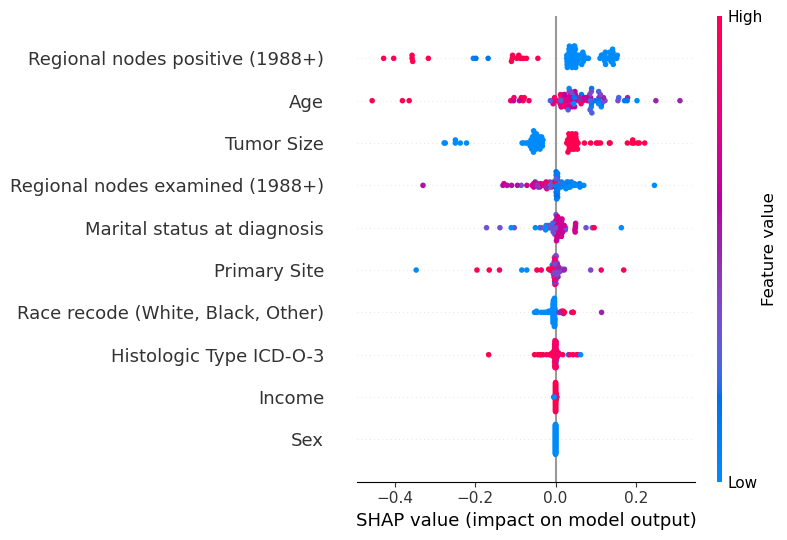

In [53]:
print("Unmitigated Variable Importance Plot - Global Interpretation")
figure = plt.figure()
shap.summary_plot(xgb_unmitigated_shap_values, X_test)

## 5.2 LIME For XGBoost

In [54]:
# import the LimeTabularExplainer module
import lime
import lime.lime_tabular
import numpy as np


# get the feature names
feature_names = list(X_test.columns)

# Fit the Explainer on the training data set using the LimeTabularExplainer
xgb_explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_test),
                                 feature_names=X_test.columns,
                                 class_names = ['Dead', 'Alive'], 
                                 mode = 'classification')

In [57]:
i = np.random.randint(len(X_test))
print(y_test.iloc[i])
xgb_exp = xgb_explainer.explain_instance(X_test.iloc[i], xgb_exp_grad_red.predict_proba)
xgb_exp.show_in_notebook(show_all=False)

1


In [58]:
xgb_exp = xgb_explainer.explain_instance(X_test.iloc[i], xgb.predict_proba)
xgb_exp.show_in_notebook(show_all=False)